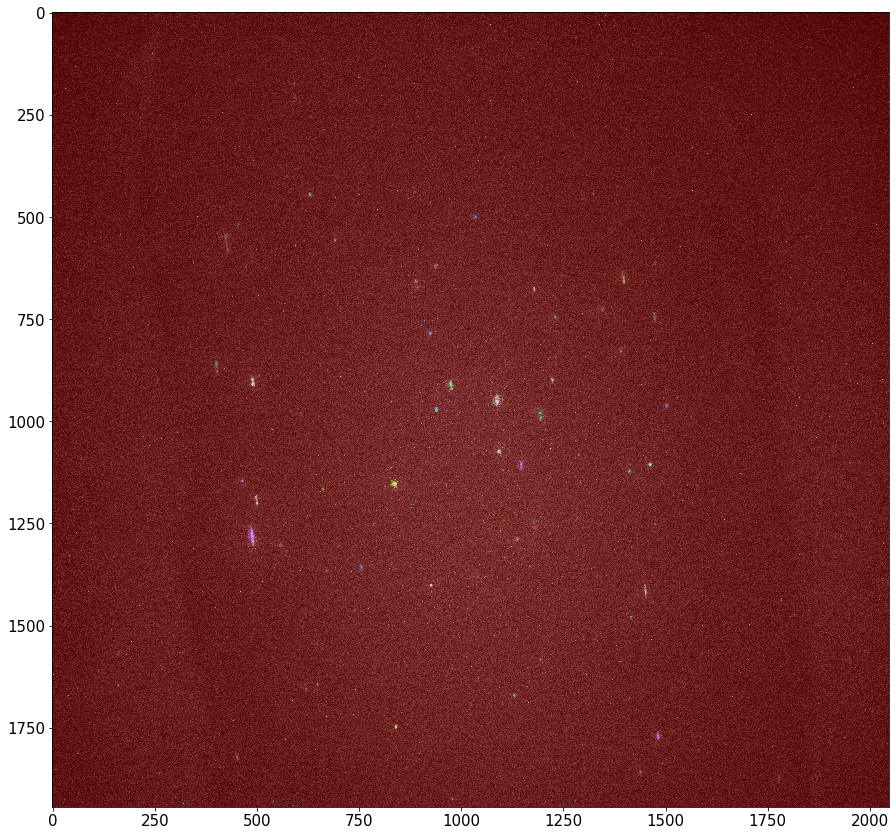

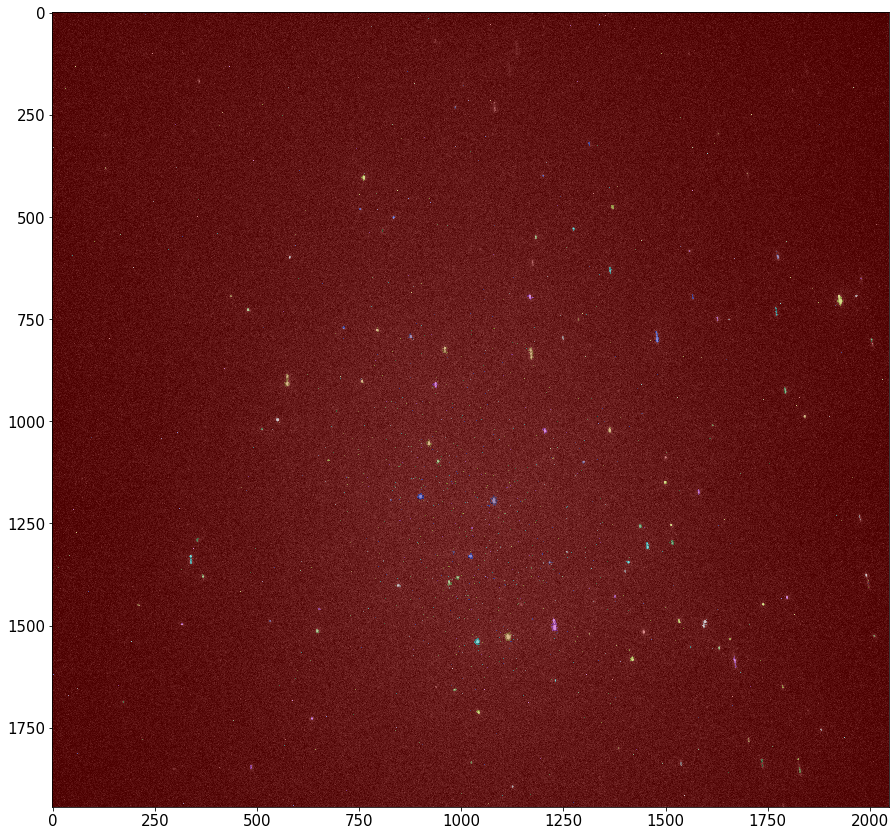

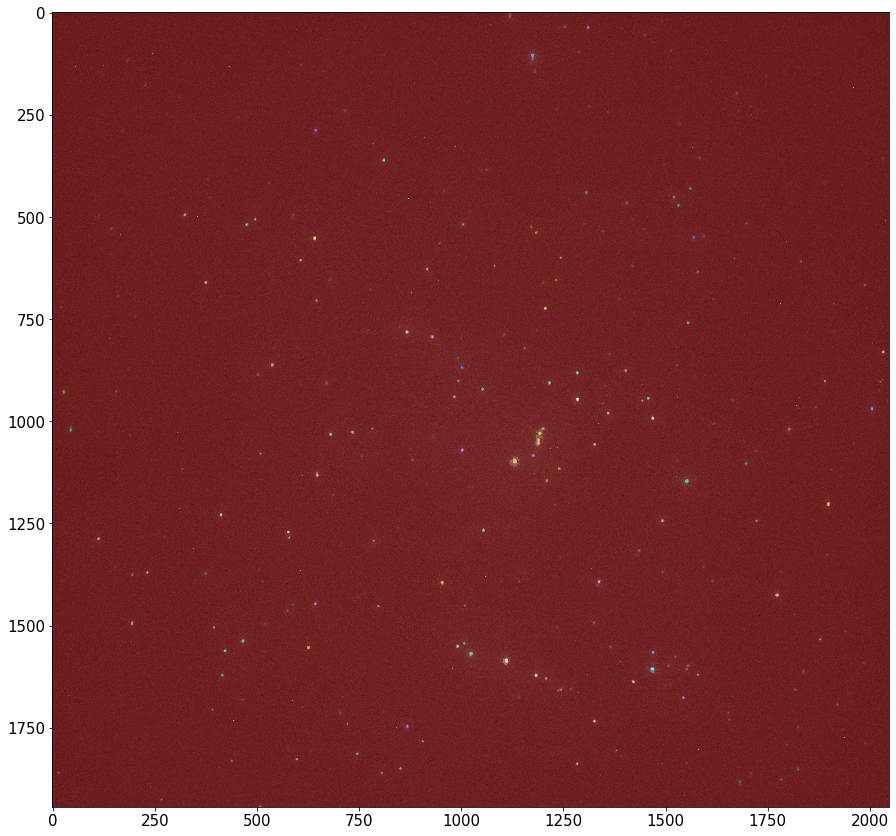

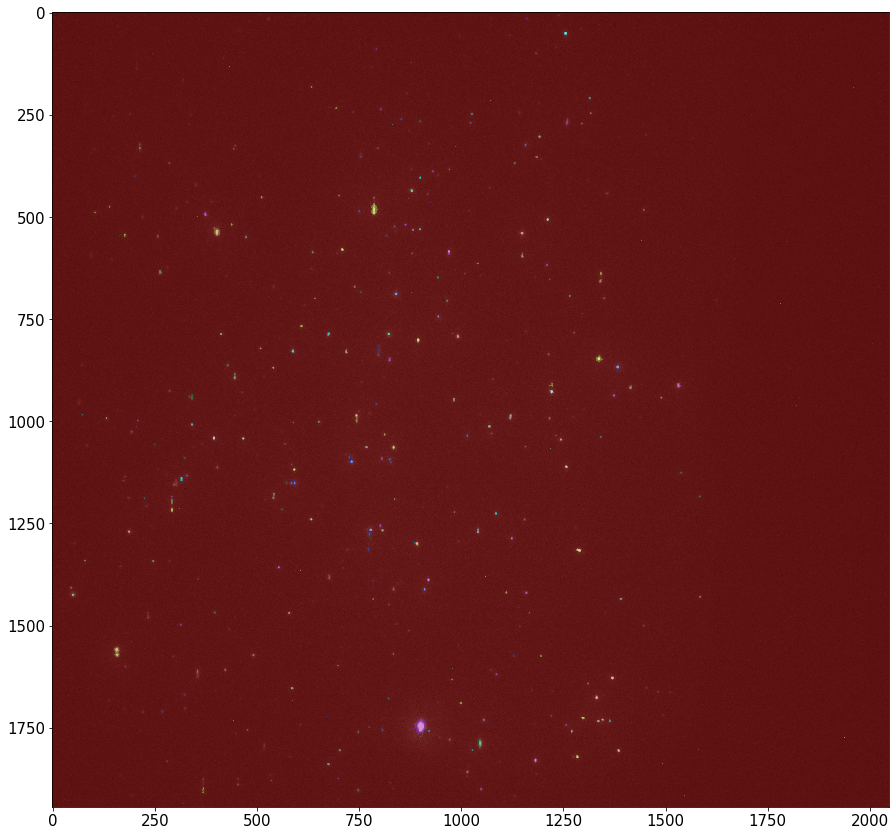

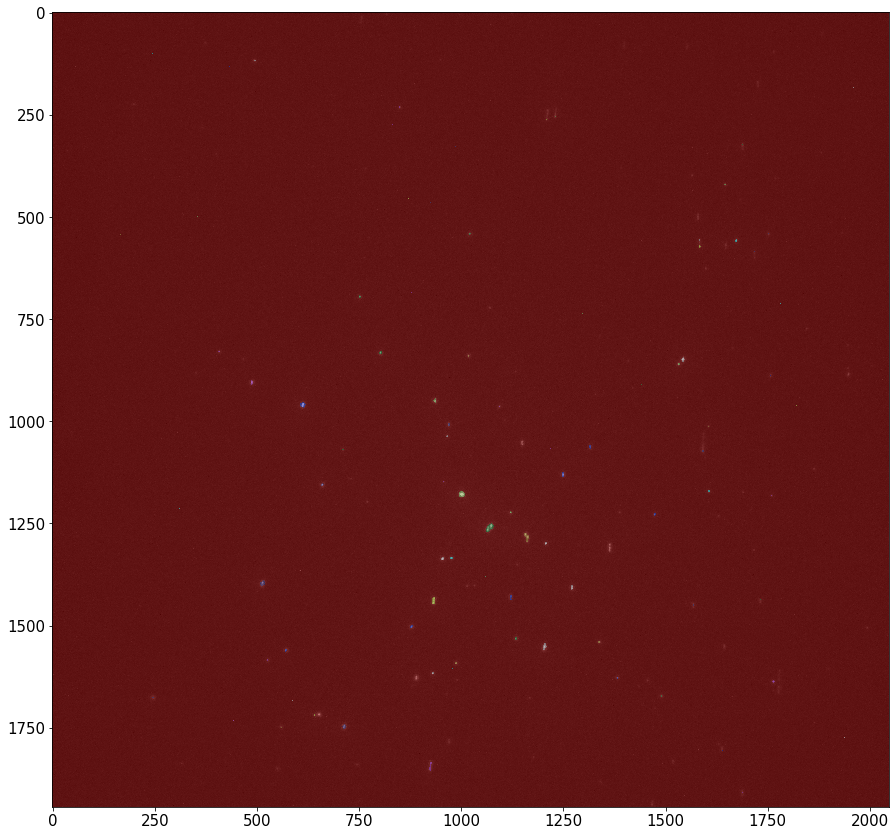

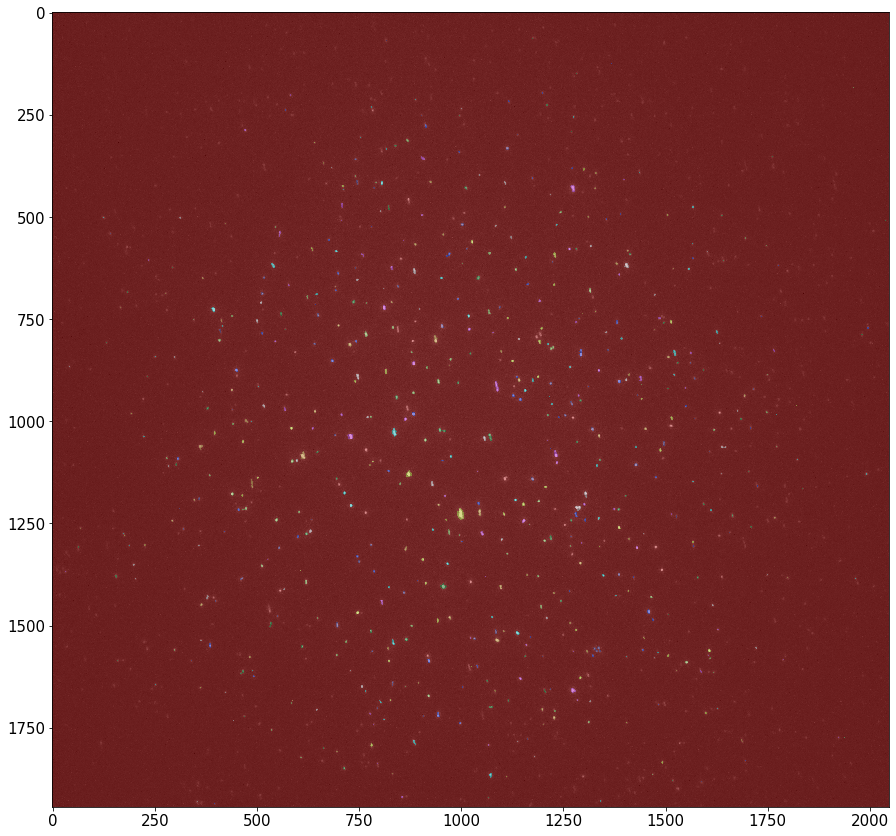

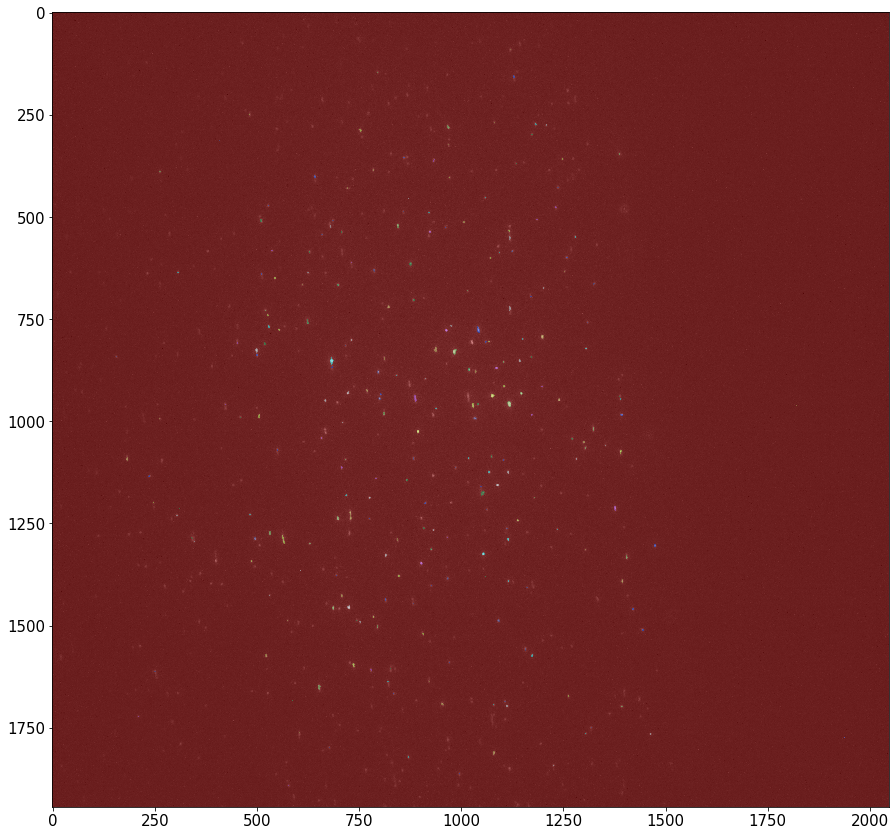

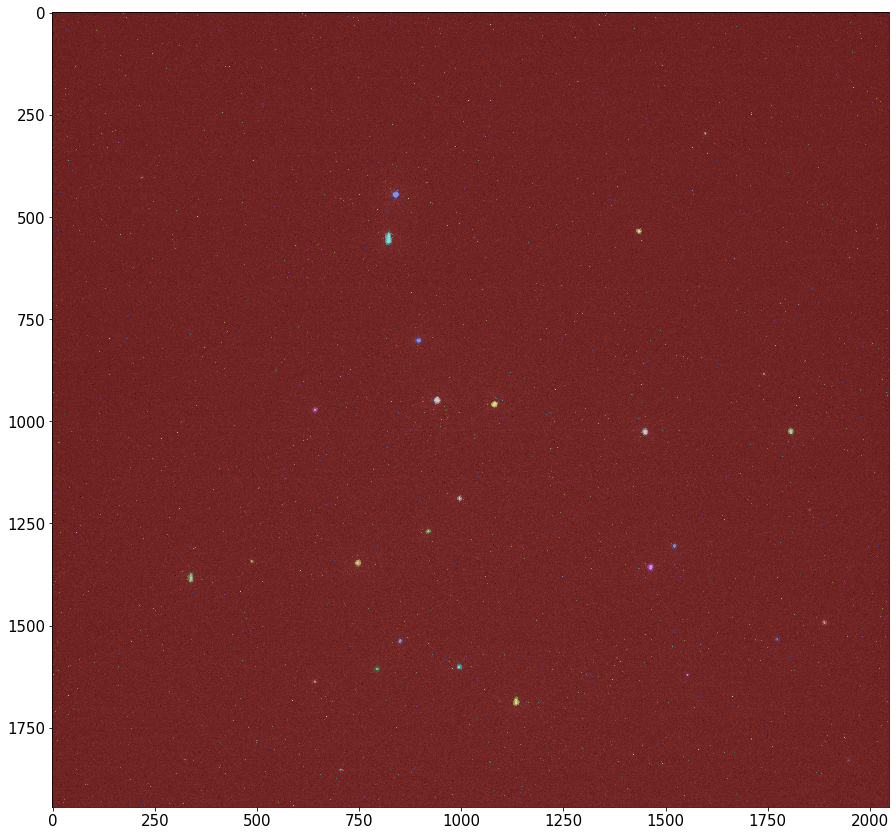

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
    
from PIL import Image
from pylab import *
from pathlib import Path
from skimage.color import rgb2gray
from skimage.measure import label, regionprops
from skimage.filters import threshold_yen
from skimage.morphology import closing, square
from skimage.segmentation import clear_border
from skimage.color import label2rgb
%matplotlib inline

shear_rate_30k = pd.DataFrame(columns=['shear rate', 'eccentricity', 'convex_area',
                                      'major_axis_length','minor_axis_length','orientation'])

# iterate over all images in a certain folder
pathlist = Path('Raw data_All images/30k_20 images/yen').glob('**/*.jpg')
for path in pathlist:
    path_in_str = str(path)
#    print(path_in_str)
    
    # open the image
    image = Image.open(path_in_str)
    
    # crop out the scale bar
    width, height = image.size
    left = 0
    top = 0
    right = width
    bottom = height-100
    im1 = image.crop((left, top, right, bottom)) 
#    im1.show()
        
    # apply threshold
    img_array = np.array(im1)
    image_gray = rgb2gray(img_array)
    image = image_gray
    thresh = threshold_yen(image)
    binary = image <= thresh
    bw = closing(image > thresh, square(3))
    plt.rcParams.update({'font.size': 15})
#    plt.figure(figsize = (15,15))
#    imshow(binary,cmap=plt.cm.gray)
    
    # remove artifacts connected to image border
    cleared = clear_border(bw)
    
    # label image regions
    label_image = label(cleared)
    image_label_overlay = label2rgb(label_image, image=image)
    fig, ax = plt.subplots(figsize=(15, 15))
    ax.imshow(image_label_overlay)
    
    # extract features
    props = regionprops(label_image,intensity_image=image_gray, coordinates='xy')

    for i in props: 
        # exclude circular(folded) and small(might be background noise) dots
        if i.eccentricity>.8 and i.convex_area>20:                                
            shear_rate_30k = shear_rate_30k.append({'shear rate': 30000, 'eccentricity': i.eccentricity, 
                                                    'convex_area': i.convex_area,'major_axis_length': i.major_axis_length,
                                                   'minor_axis_length': i.minor_axis_length,'orientation': i.orientation},
                                                   ignore_index=True)

print("30k_20 images", shear_rate_30k, sep='\n')

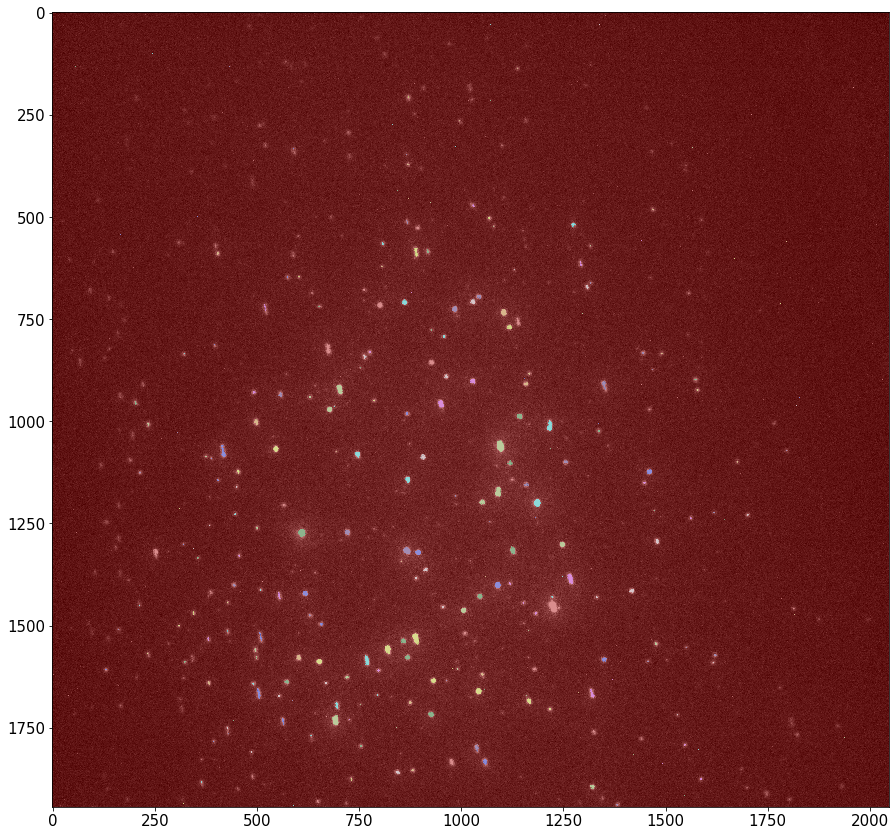

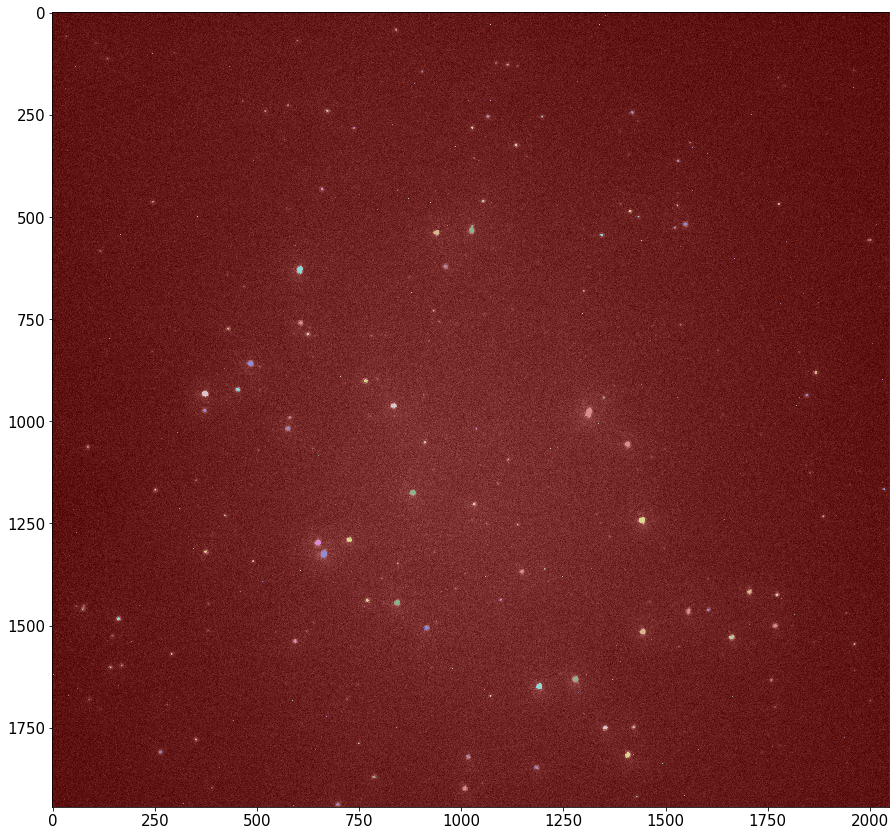

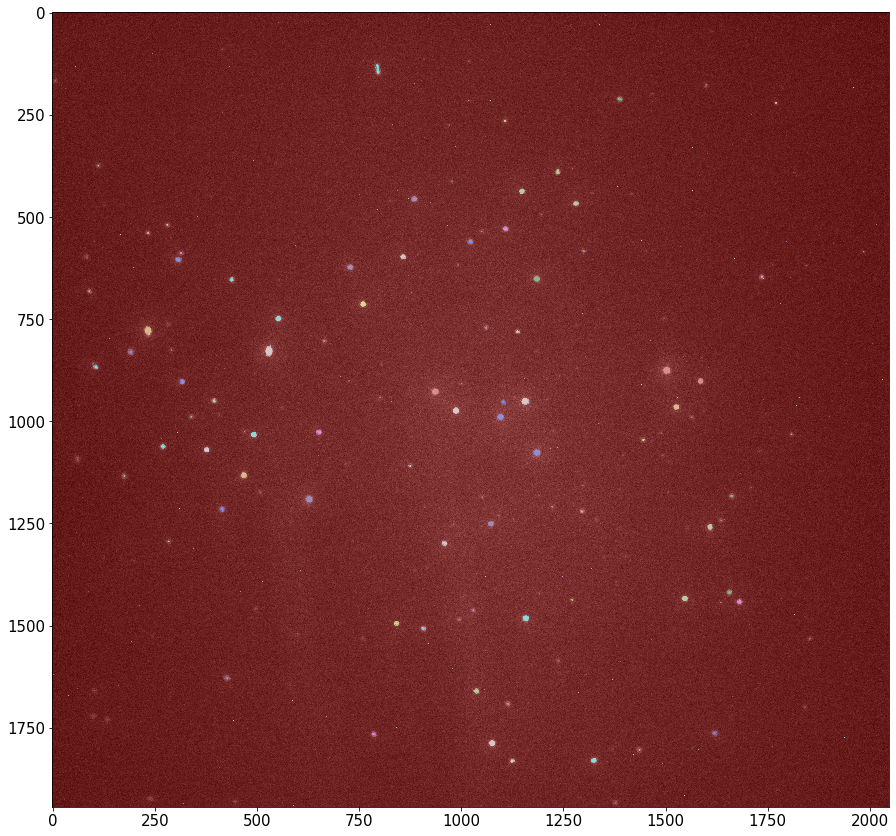

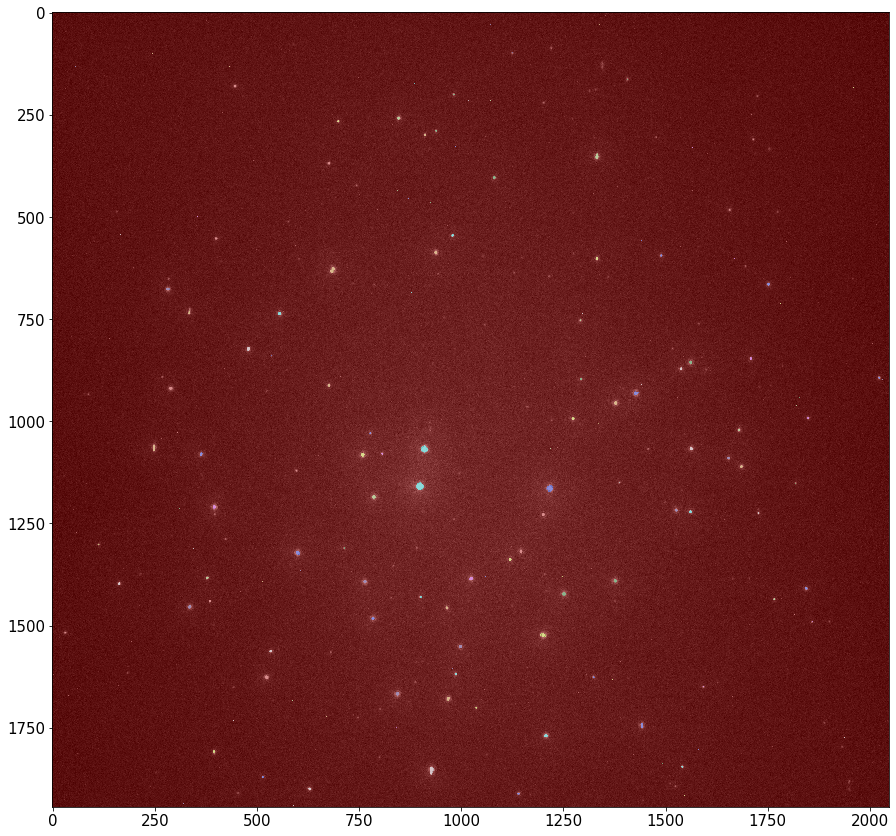

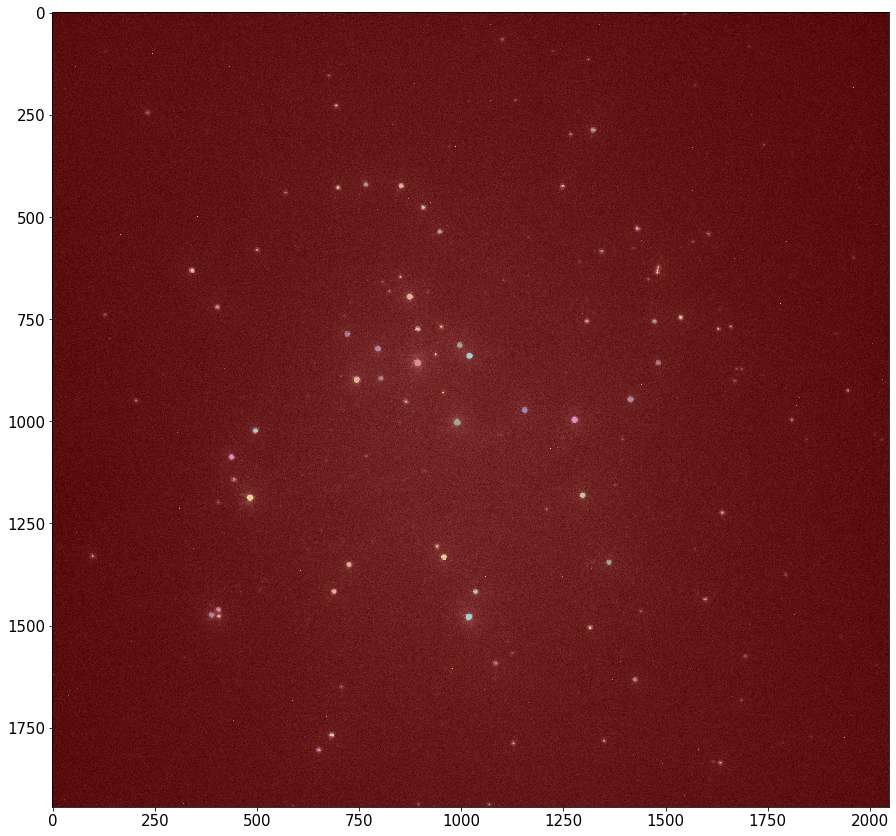

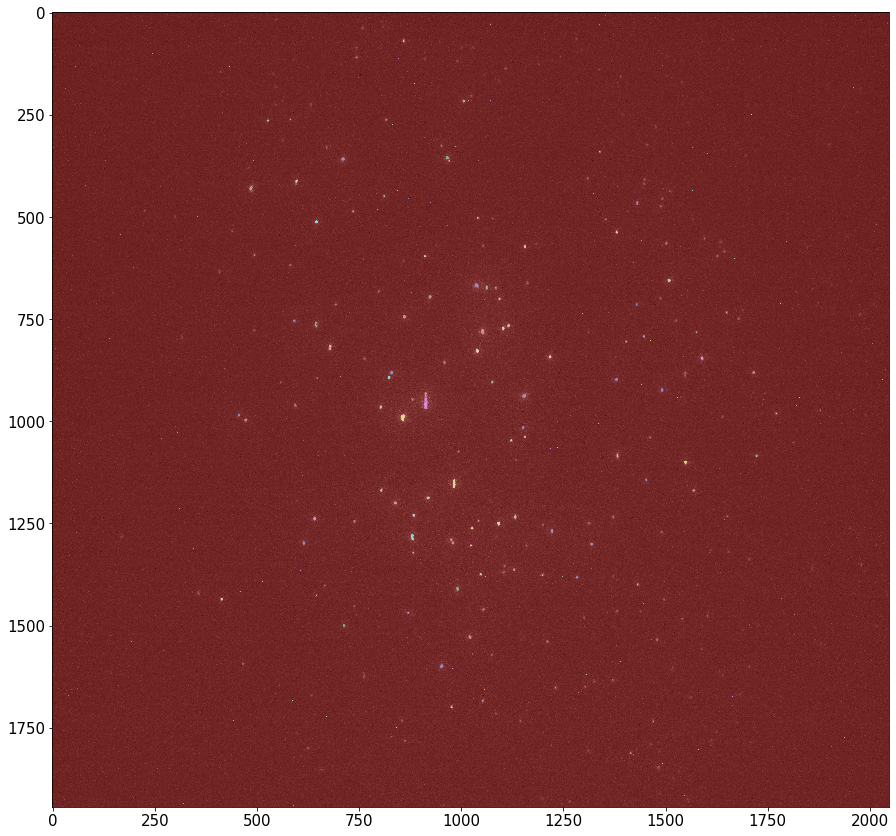

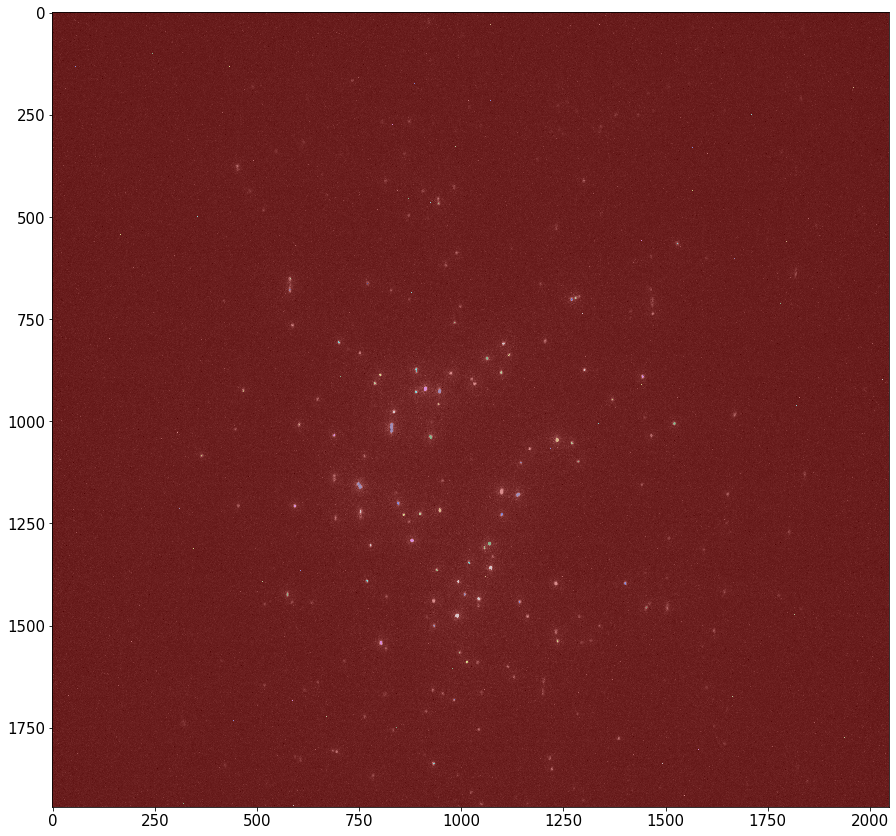

In [4]:
from skimage.filters import threshold_minimum

# iterate over all images in a certain folder
pathlist = Path('Raw data_All images/30k_20 images/minimum').glob('**/*.jpg')
for path in pathlist:
    path_in_str = str(path)
#    print(path_in_str)
    
    # open the image
    image = Image.open(path_in_str)
    
    # crop out scale bar
    width, height = image.size
    left = 0
    top = 0
    right = width
    bottom = height-100
    im1 = image.crop((left, top, right, bottom)) 
#    im1.show()
    
    # apply threshold
    img_array = np.array(im1)
    image_gray = rgb2gray(img_array)
    image = image_gray
    thresh = threshold_minimum(image)
    binary = image <= thresh
    bw = closing(image > thresh, square(3))
    plt.rcParams.update({'font.size': 15})
#    plt.figure(figsize = (15,15))
#    imshow(binary,cmap=plt.cm.gray)
    
    # remove artifacts connected to image border
    cleared = clear_border(bw)
    
    # label image regions
    label_image = label(cleared)
    image_label_overlay = label2rgb(label_image, image=image)
    fig, ax = plt.subplots(figsize=(15, 15))
    ax.imshow(image_label_overlay)
    
    # extract features
    props = regionprops(label_image,intensity_image=image_gray, coordinates='xy')
    
    for i in props: 
        # exclude circular(folded) and small(might be background noise) dots
        if i.eccentricity>.8 and i.convex_area>20:                                
            shear_rate_30k = shear_rate_30k.append({'shear rate': 30000, 'eccentricity': i.eccentricity, 
                                                    'convex_area': i.convex_area,'major_axis_length': i.major_axis_length,
                                                   'minor_axis_length': i.minor_axis_length,'orientation': i.orientation},
                                                   ignore_index=True)

print("30k_20 images", shear_rate_30k, sep='\n')

In [5]:
# save dataframe
shear_rate_30k.to_pickle('shear_rate_30k')
a = pd.read_pickle('shear_rate_30k')
print(a)

     shear rate  eccentricity  convex_area  major_axis_length  \
0       30000.0      0.892852        112.0          15.863782   
1       30000.0      0.833936         63.0          11.278831   
2       30000.0      0.840602         59.0          11.507936   
3       30000.0      0.940296         42.0          11.918548   
4       30000.0      0.973679         64.0          18.712281   
5       30000.0      0.852789         70.0          12.399092   
6       30000.0      0.937242         87.0          16.801378   
7       30000.0      0.939972        233.0          27.021110   
8       30000.0      0.821405        316.0          24.832071   
9       30000.0      0.956625        293.0          31.934557   
10      30000.0      0.921361        260.0          25.992595   
11      30000.0      0.825083         94.0          13.649284   
12      30000.0      0.970421        170.0          27.003172   
13      30000.0      0.818156         68.0          11.209117   
14      30000.0      0.93